In [1]:
import netCDF4
import itertools

from tqdm import tqdm

Nx = 512
Ny = 512
Na = 5

def tau_1(arr, tau, counter):
    
    arr_tau_1 = np.zeros((Nx, Ny))
    
    for i, j in tqdm(itertools.product(range(Nx), range(Ny)), desc = str(counter)):
        
        idx_tau_1 = np.argmin(abs(tau[:, j, i] - 1.0))
        
        arr_tau_1[i, j] = arr[idx_tau_1, j, i]
        
    return arr_tau_1

mu_id = ['10', '8', '6', '4', '2']

T_ssd = np.zeros((Na, Nx, Ny))
p_ssd = np.zeros((Na, Nx, Ny))
d_ssd = np.zeros((Na, Nx, Ny))
t_ssd = np.zeros((Na, Nx, Ny))

T_300 = np.zeros((Na, Nx, Ny))
p_300 = np.zeros((Na, Nx, Ny))
d_300 = np.zeros((Na, Nx, Ny))
t_300 = np.zeros((Na, Nx, Ny))

for i in range(Na):
    
    k = 6 * i
    
    T = np.array(netCDF4.Dataset('./ssd/222809/' + mu_id[i] + '/T_onTau.222809.nc.1')['T'])
    p = np.array(netCDF4.Dataset('./ssd/222809/' + mu_id[i] + '/P_onTau.222809.nc.1')['P'])
    d = np.array(netCDF4.Dataset('./ssd/222809/' + mu_id[i] + '/rho_onTau.222809.nc.1')['R'])
    t = np.array(netCDF4.Dataset('./ssd/222809/' + mu_id[i] + '/taugrid.222809.nc.1')['tau'])
    
    T_ssd[i, :, :] = tau_1(T, t, k + 1)
    p_ssd[i, :, :] = tau_1(p, t, k + 2)
    d_ssd[i, :, :] = tau_1(d, t, k + 3)

    T = np.array(netCDF4.Dataset('./300G/627321/' + mu_id[i] + '/T_onTau.627321.nc.1')['T'])
    p = np.array(netCDF4.Dataset('./300G/627321/' + mu_id[i] + '/P_onTau.627321.nc.1')['P'])
    d = np.array(netCDF4.Dataset('./300G/627321/' + mu_id[i] + '/rho_onTau.627321.nc.1')['R'])
    t = np.array(netCDF4.Dataset('./300G/627321/' + mu_id[i] + '/taugrid.627321.nc.1')['tau'])
    
    T_300[i, :, :] = tau_1(T, t, k + 4)
    p_300[i, :, :] = tau_1(p, t, k + 5)
    d_300[i, :, :] = tau_1(d, t, k + 6)

np.savez('ssd',  T = T_ssd, p = p_ssd, d = d_ssd)
np.savez('300G', T = T_300, p = p_300, d = d_300)

1: 262144it [00:06, 41949.87it/s]
2: 262144it [00:06, 42636.14it/s]
3: 262144it [00:05, 45433.63it/s]
4: 262144it [00:05, 46937.31it/s]
5: 262144it [00:05, 47140.17it/s]
6: 262144it [00:05, 46619.67it/s]
7: 262144it [00:05, 43828.78it/s]
8: 262144it [00:05, 46972.23it/s]
9: 262144it [00:05, 47019.40it/s]
10: 262144it [00:06, 43595.05it/s]
11: 262144it [00:06, 43620.81it/s]
12: 262144it [00:05, 46600.07it/s]
13: 262144it [00:06, 43683.58it/s]
14: 262144it [00:05, 46300.70it/s]
15: 262144it [00:05, 46557.85it/s]
16: 262144it [00:05, 44480.83it/s]
17: 262144it [00:05, 45112.78it/s]
18: 262144it [00:05, 46084.01it/s]
19: 262144it [00:05, 46500.45it/s]
20: 262144it [00:06, 43026.24it/s]
21: 262144it [00:05, 43996.40it/s]
22: 262144it [00:06, 42766.32it/s]
23: 262144it [00:05, 46935.24it/s]
24: 262144it [00:06, 41983.44it/s]
25: 262144it [00:05, 46379.47it/s]
26: 262144it [00:06, 42573.83it/s]
27: 262144it [00:06, 41786.35it/s]
28: 262144it [00:06, 41544.62it/s]
29: 262144it [00:06, 43328.04

In [2]:
T_ssd = np.load('ssd.npz')['T']
p_ssd = np.load('ssd.npz')['p']
d_ssd = np.load('ssd.npz')['d']

T_300 = np.load('300G.npz')['T']
p_300 = np.load('300G.npz')['p']
d_300 = np.load('300G.npz')['d']

#tmin = min(np.min(T_ssd), np.min(T_300))
#pmin = min(np.min(p_ssd), np.min(p_300))
#dmin = min(np.min(d_ssd), np.min(d_300))

#tmax = max(np.max(T_ssd), np.max(T_300))
#pmax = max(np.max(p_ssd), np.max(p_300))
#dmax = max(np.max(d_ssd), np.max(d_300))

#tmin = min(np.percentile(T_ssd, 5), np.percentile(T_300, 5))
#pmin = min(np.percentile(p_ssd, 5), np.percentile(p_300, 5))
#dmin = min(np.percentile(d_ssd, 5), np.percentile(d_300, 5))

#tmax = max(np.percentile(T_ssd, 95), np.percentile(T_300, 95))
#pmax = max(np.percentile(p_ssd, 95), np.percentile(p_300, 95))
#dmax = max(np.percentile(d_ssd, 95), np.percentile(d_300, 95))

lp = 5
up = 95

tmin = min(np.percentile(T_ssd[0, :, :], lp), np.percentile(T_300[0, :, :], lp))
pmin = min(np.percentile(p_ssd[0, :, :], lp), np.percentile(p_300[0, :, :], lp))
dmin = min(np.percentile(d_ssd[0, :, :], lp), np.percentile(d_300[0, :, :], lp))

tmax = max(np.percentile(T_ssd[0, :, :], up), np.percentile(T_300[0, :, :], up))
pmax = max(np.percentile(p_ssd[0, :, :], up), np.percentile(p_300[0, :, :], up))
dmax = max(np.percentile(d_ssd[0, :, :], up), np.percentile(d_300[0, :, :], up))

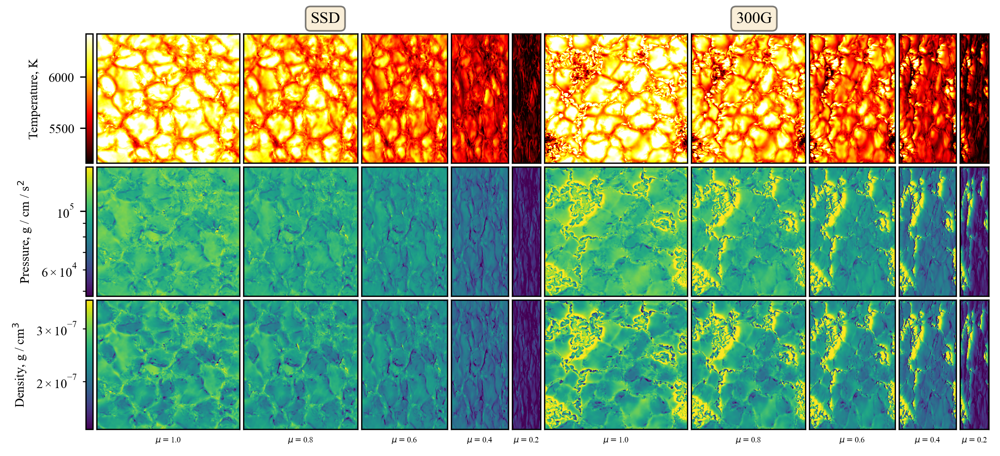

In [21]:
import matplotlib.pyplot as plt

import matplotlib.gridspec as gridspec
from matplotlib.colorbar import Colorbar

from matplotlib.ticker import AutoMinorLocator
from matplotlib.ticker import MultipleLocator

import matplotlib.colors as colors

from  matplotlib.colors import LogNorm

props = dict(boxstyle = 'round', facecolor = 'wheat', alpha = 0.5)

plt.rcParams.update({'font.size': 8})
plt.rcParams["font.family"] = 'Times New Roman'

colormap1 = 'hot'
colormap2 = 'viridis'
colormap3 = 'viridis'

mus = ['1.0', '0.8', '0.6', '0.4', '0.2']
    
plt.close('all')

fig = plt.figure(dpi = 300)

fig.set_size_inches(10, 4.5, forward = True)

fig.tight_layout()

gs = gridspec.GridSpec(3, 11, width_ratios = [0.05, 1, 0.8, 0.6, 0.4, 0.2, 1, 0.8, 0.6, 0.4, 0.2], hspace = 0.03, wspace = 0.05)

temp_cbar = plt.subplot(gs[0, 0])
pres_cbar = plt.subplot(gs[1, 0])
dens_cbar = plt.subplot(gs[2, 0])

for i in range(1, 6):

#------------------------------------------
# settings for SSD

    ssd_temp = plt.subplot(gs[0, i])
    ssd_pres = plt.subplot(gs[1, i])
        
    ssd_dens = plt.subplot(gs[2, i])
        
    if i == 2: ssd_temp.text(300, 600, 'SSD', fontsize = 10, verticalalignment = 'top', bbox = props)

    ssd_temp.set_xlim(0, 511)
    ssd_temp.set_ylim(0, 511)

    ssd_pres.set_xlim(0, 511)
    ssd_pres.set_ylim(0, 511)
        
    ssd_dens.set_xlim(0, 511)
    ssd_dens.set_ylim(0, 511)

    ssd_temp.xaxis.set_ticklabels([])
    ssd_temp.yaxis.set_ticklabels([])
        
    ssd_pres.xaxis.set_ticklabels([])
    ssd_pres.yaxis.set_ticklabels([])
        
    ssd_dens.xaxis.set_ticklabels([])
    ssd_dens.yaxis.set_ticklabels([])
        
    ssd_temp.xaxis.set_ticks([])
    ssd_temp.yaxis.set_ticks([])
    
    ssd_pres.xaxis.set_ticks([])
    ssd_pres.yaxis.set_ticks([])
        
    ssd_dens.xaxis.set_ticks([])
    ssd_dens.yaxis.set_ticks([])

#------------------------------------------
# settings for 300G

    mag_temp = plt.subplot(gs[0, 5 + i])
    mag_pres = plt.subplot(gs[1, 5 + i])
        
    mag_dens = plt.subplot(gs[2, 5 + i])
        
    if i == 2: mag_temp.text(200, 600, '300G', fontsize = 10, verticalalignment = 'top', bbox = props)

    mag_temp.set_xlim(0, 511)
    mag_temp.set_ylim(0, 511)

    mag_pres.set_xlim(0, 511)
    mag_pres.set_ylim(0, 511)
        
    mag_dens.set_xlim(0, 511)
    mag_dens.set_ylim(0, 511)

    mag_temp.xaxis.set_ticklabels([])
    mag_temp.yaxis.set_ticklabels([])
        
    mag_pres.xaxis.set_ticklabels([])
    mag_pres.yaxis.set_ticklabels([])
        
    mag_dens.xaxis.set_ticklabels([])
    mag_dens.yaxis.set_ticklabels([])
        
    mag_temp.xaxis.set_ticks([])
    mag_temp.yaxis.set_ticks([])
    
    mag_pres.xaxis.set_ticks([])
    mag_pres.yaxis.set_ticks([])
        
    mag_dens.xaxis.set_ticks([])
    mag_dens.yaxis.set_ticks([])
        
#----------------------------------------------
        
    pnorm = colors.LogNorm(vmin = pmin, vmax = pmax)
    dnorm = colors.LogNorm(vmin = dmin, vmax = dmax)
        
#    if j == 7: mpnorm = MidPointLogNorm(vmin = rmin, vmax = rmax, midpoint = 1)
#    if j != 7: mpnorm = colors.TwoSlopeNorm(vmin = rmin, vmax = rmax, vcenter = 1)
    
    ssd_temp_img = ssd_temp.imshow(T_ssd[i - 1, :, :], cmap = colormap1, vmin = tmin, vmax = tmax, aspect = 'auto')
    ssd_pres_img = ssd_pres.imshow(p_ssd[i - 1, :, :], cmap = colormap2, norm = pnorm, aspect = 'auto')
    ssd_dens_img = ssd_dens.imshow(d_ssd[i - 1, :, :], cmap = colormap3, norm = dnorm, aspect = 'auto')
        
    mag_temp_img = mag_temp.imshow(T_300[i - 1, :, :], cmap = colormap1, vmin = tmin, vmax = tmax, aspect = 'auto')
    mag_pres_img = mag_pres.imshow(p_300[i - 1, :, :], cmap = colormap2, norm = pnorm, aspect = 'auto')
    mag_dens_img = mag_dens.imshow(d_300[i - 1, :, :], cmap = colormap3, norm = dnorm, aspect = 'auto')
    
    temp_cb = Colorbar(ax = temp_cbar, mappable = ssd_temp_img, orientation = 'vertical', ticklocation = 'left')
    pres_cb = Colorbar(ax = pres_cbar, mappable = ssd_pres_img, orientation = 'vertical', ticklocation = 'left')
    dens_cb = Colorbar(ax = dens_cbar, mappable = ssd_dens_img, orientation = 'vertical', ticklocation = 'left')
        
    ssd_dens.set_xlabel(r'$\mu = $' + mus[i - 1], fontsize = 5)
    mag_dens.set_xlabel(r'$\mu = $' + mus[i - 1], fontsize = 5)
        
temp_cb.set_label('Temperature, K', labelpad = 5)
pres_cb.set_label('Pressure, g / cm / s$^2$', labelpad = 5)
dens_cb.set_label(r'Density, g / cm$^3$', labelpad = 5)

plt.savefig('intro_full.pdf', bbox_inches = 'tight')

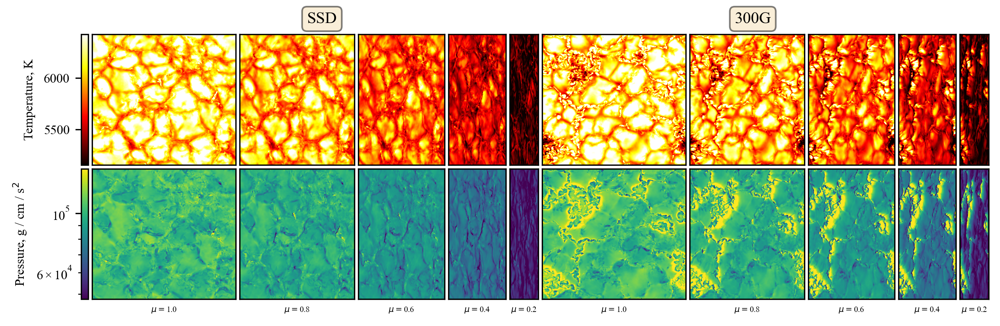

In [25]:
import matplotlib.pyplot as plt

import matplotlib.gridspec as gridspec
from matplotlib.colorbar import Colorbar

from matplotlib.ticker import AutoMinorLocator
from matplotlib.ticker import MultipleLocator

import matplotlib.colors as colors

from  matplotlib.colors import LogNorm

props = dict(boxstyle = 'round', facecolor = 'wheat', alpha = 0.5)

plt.rcParams.update({'font.size': 8})
plt.rcParams["font.family"] = 'Times New Roman'

colormap1 = 'hot'
colormap2 = 'viridis'

mus = ['1.0', '0.8', '0.6', '0.4', '0.2']
    
plt.close('all')

fig = plt.figure(dpi = 300)

fig.set_size_inches(10, 3.0, forward = True)

fig.tight_layout()

gs = gridspec.GridSpec(2, 11, width_ratios = [0.05, 1, 0.8, 0.6, 0.4, 0.2, 1, 0.8, 0.6, 0.4, 0.2], hspace = 0.03, wspace = 0.05)

temp_cbar = plt.subplot(gs[0, 0])
pres_cbar = plt.subplot(gs[1, 0])

for i in range(1, 6):

#------------------------------------------
# settings for SSD

    ssd_temp = plt.subplot(gs[0, i])
    ssd_pres = plt.subplot(gs[1, i])
        
    if i == 2: ssd_temp.text(300, 600, 'SSD', fontsize = 10, verticalalignment = 'top', bbox = props)

    ssd_temp.set_xlim(0, 511)
    ssd_temp.set_ylim(0, 511)

    ssd_pres.set_xlim(0, 511)
    ssd_pres.set_ylim(0, 511)

    ssd_temp.xaxis.set_ticklabels([])
    ssd_temp.yaxis.set_ticklabels([])
        
    ssd_pres.xaxis.set_ticklabels([])
    ssd_pres.yaxis.set_ticklabels([])
        
    ssd_temp.xaxis.set_ticks([])
    ssd_temp.yaxis.set_ticks([])
    
    ssd_pres.xaxis.set_ticks([])
    ssd_pres.yaxis.set_ticks([])

#------------------------------------------
# settings for 300G

    mag_temp = plt.subplot(gs[0, 5 + i])
    mag_pres = plt.subplot(gs[1, 5 + i])
        
    if i == 2: mag_temp.text(200, 600, '300G', fontsize = 10, verticalalignment = 'top', bbox = props)

    mag_temp.set_xlim(0, 511)
    mag_temp.set_ylim(0, 511)

    mag_pres.set_xlim(0, 511)
    mag_pres.set_ylim(0, 511)

    mag_temp.xaxis.set_ticklabels([])
    mag_temp.yaxis.set_ticklabels([])
        
    mag_pres.xaxis.set_ticklabels([])
    mag_pres.yaxis.set_ticklabels([])
        
    mag_temp.xaxis.set_ticks([])
    mag_temp.yaxis.set_ticks([])
    
    mag_pres.xaxis.set_ticks([])
    mag_pres.yaxis.set_ticks([])
        
#----------------------------------------------
        
    pnorm = colors.LogNorm(vmin = pmin, vmax = pmax)
    
    ssd_temp_img = ssd_temp.imshow(T_ssd[i - 1, :, :], cmap = colormap1, vmin = tmin, vmax = tmax, aspect = 'auto')
    ssd_pres_img = ssd_pres.imshow(p_ssd[i - 1, :, :], cmap = colormap2, norm = pnorm, aspect = 'auto')
        
    mag_temp_img = mag_temp.imshow(T_300[i - 1, :, :], cmap = colormap1, vmin = tmin, vmax = tmax, aspect = 'auto')
    mag_pres_img = mag_pres.imshow(p_300[i - 1, :, :], cmap = colormap2, norm = pnorm, aspect = 'auto')
    
    temp_cb = Colorbar(ax = temp_cbar, mappable = ssd_temp_img, orientation = 'vertical', ticklocation = 'left')
    pres_cb = Colorbar(ax = pres_cbar, mappable = ssd_pres_img, orientation = 'vertical', ticklocation = 'left')
        
    ssd_pres.set_xlabel(r'$\mu = $' + mus[i - 1], fontsize = 5)
    mag_pres.set_xlabel(r'$\mu = $' + mus[i - 1], fontsize = 5)
        
temp_cb.set_label('Temperature, K', labelpad = 5)
pres_cb.set_label('Pressure, g / cm / s$^2$', labelpad = 5)

plt.savefig('intro_img_1.pdf', bbox_inches = 'tight')

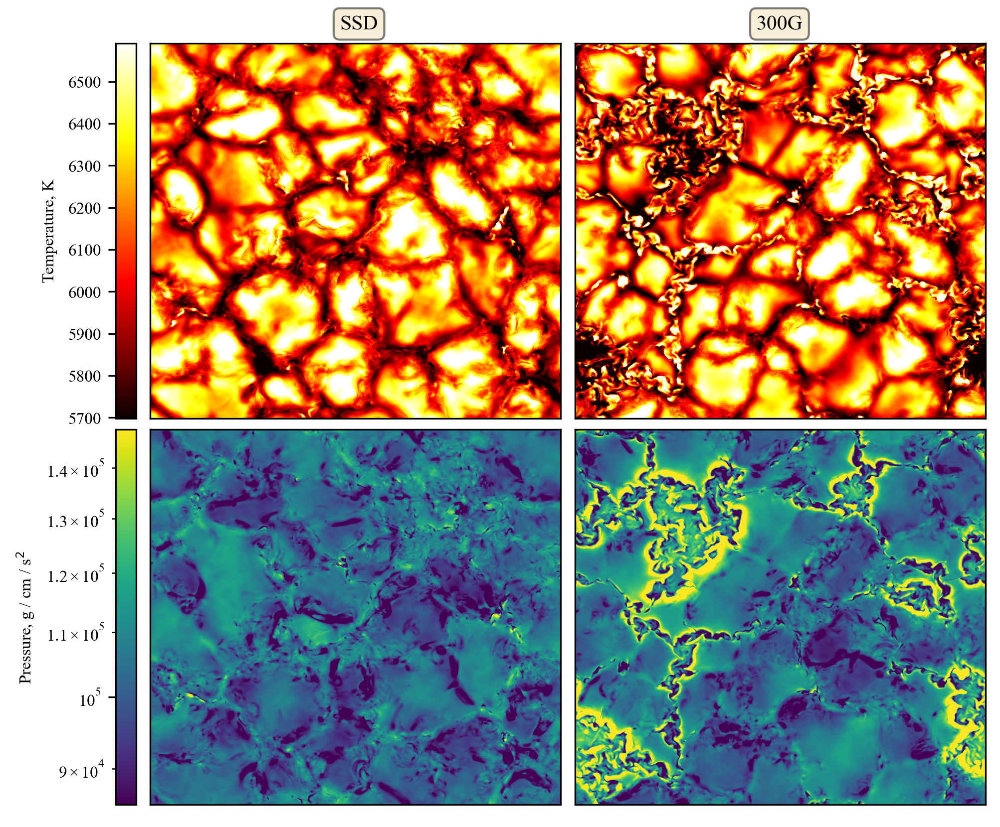

In [8]:
import matplotlib.pyplot as plt

import matplotlib.gridspec as gridspec
from matplotlib.colorbar import Colorbar

from matplotlib.ticker import AutoMinorLocator
from matplotlib.ticker import MultipleLocator

import matplotlib.colors as colors

from  matplotlib.colors import LogNorm

props = dict(boxstyle = 'round', facecolor = 'wheat', alpha = 0.5)

plt.rcParams.update({'font.size': 8})
plt.rcParams["font.family"] = 'Times New Roman'

colormap1 = 'hot'
colormap2 = 'viridis'

mus = ['1.0', '0.8', '0.6', '0.4', '0.2']
    
plt.close('all')

fig = plt.figure(dpi = 300)

fig.set_size_inches(7.5, 11.25 * 3 / 5, forward = True)

fig.tight_layout()

gs = gridspec.GridSpec(2, 3, width_ratios = [0.05, 1, 1], hspace = 0.03, wspace = 0.05)

temp_cbar = plt.subplot(gs[0, 0])
pres_cbar = plt.subplot(gs[1, 0])

#------------------------------------------
# settings for SSD

ssd_temp = plt.subplot(gs[0, 1])
ssd_pres = plt.subplot(gs[1, 1])
        
ssd_temp.text(236, 550, 'SSD', fontsize = 10, verticalalignment = 'top', bbox = props)

ssd_temp.set_xlim(0, 511)
ssd_temp.set_ylim(0, 511)

ssd_pres.set_xlim(0, 511)
ssd_pres.set_ylim(0, 511)

ssd_temp.xaxis.set_ticklabels([])
ssd_temp.yaxis.set_ticklabels([])
        
ssd_pres.xaxis.set_ticklabels([])
ssd_pres.yaxis.set_ticklabels([])
        
ssd_temp.xaxis.set_ticks([])
ssd_temp.yaxis.set_ticks([])
    
ssd_pres.xaxis.set_ticks([])
ssd_pres.yaxis.set_ticks([])

#------------------------------------------
# settings for 300G

mag_temp = plt.subplot(gs[0, 2])
mag_pres = plt.subplot(gs[1, 2])
        
mag_temp.text(226, 550, '300G', fontsize = 10, verticalalignment = 'top', bbox = props)

mag_temp.set_xlim(0, 511)
mag_temp.set_ylim(0, 511)

mag_pres.set_xlim(0, 511)
mag_pres.set_ylim(0, 511)

mag_temp.xaxis.set_ticklabels([])
mag_temp.yaxis.set_ticklabels([])
        
mag_pres.xaxis.set_ticklabels([])
mag_pres.yaxis.set_ticklabels([])
        
mag_temp.xaxis.set_ticks([])
mag_temp.yaxis.set_ticks([])
    
mag_pres.xaxis.set_ticks([])
mag_pres.yaxis.set_ticks([])
        
#----------------------------------------------
        
pnorm = colors.LogNorm(vmin = pmin, vmax = pmax)
    
ssd_temp_img = ssd_temp.imshow(T_ssd[0, :, :], cmap = colormap1, vmin = tmin, vmax = tmax, aspect = 'auto')
ssd_pres_img = ssd_pres.imshow(p_ssd[0, :, :], cmap = colormap2, norm = pnorm, aspect = 'auto')
        
mag_temp_img = mag_temp.imshow(T_300[0, :, :], cmap = colormap1, vmin = tmin, vmax = tmax, aspect = 'auto')
mag_pres_img = mag_pres.imshow(p_300[0, :, :], cmap = colormap2, norm = pnorm, aspect = 'auto')
    
temp_cb = Colorbar(ax = temp_cbar, mappable = ssd_temp_img, orientation = 'vertical', ticklocation = 'left')
pres_cb = Colorbar(ax = pres_cbar, mappable = ssd_pres_img, orientation = 'vertical', ticklocation = 'left')
        
#ssd_pres.set_xlabel(r'$\mu = $' + mus[0])
#mag_pres.set_xlabel(r'$\mu = $' + mus[0])
        
temp_cb.set_label('Temperature, K', labelpad = 5)
pres_cb.set_label('Pressure, g / cm / s$^2$', labelpad = 5)

plt.savefig('intro_img_1.pdf', bbox_inches = 'tight')

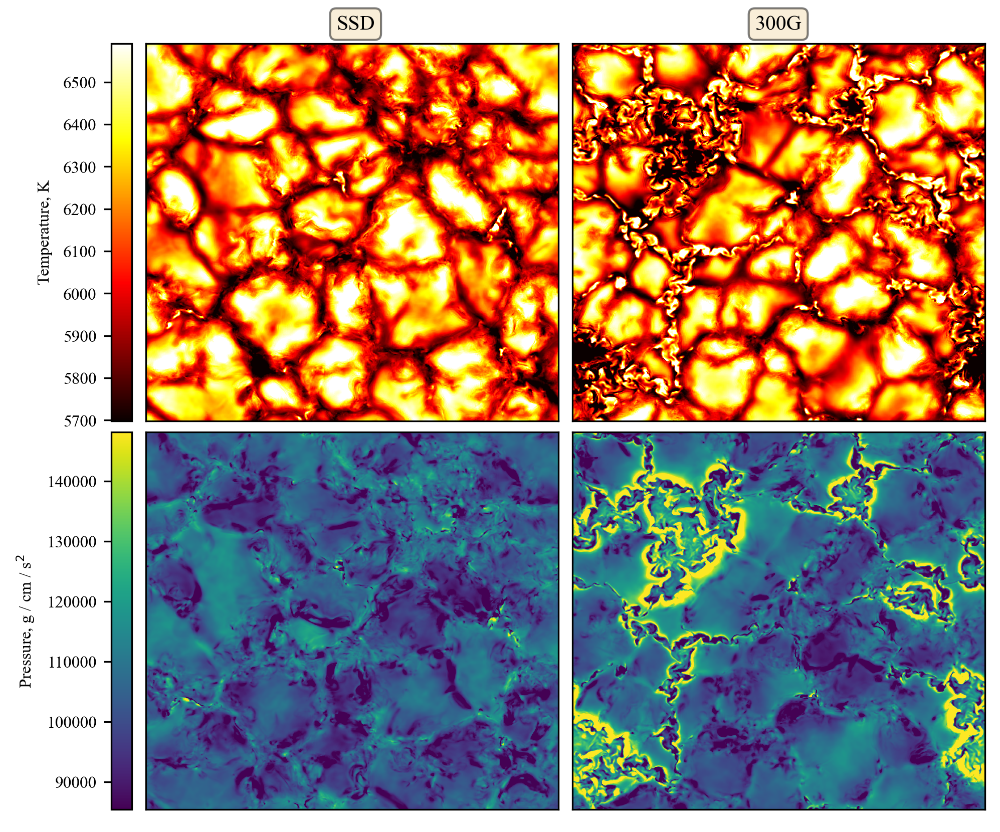

In [4]:
import matplotlib.pyplot as plt

import matplotlib.gridspec as gridspec
from matplotlib.colorbar import Colorbar

from matplotlib.ticker import AutoMinorLocator
from matplotlib.ticker import MultipleLocator

import matplotlib.colors as colors

from  matplotlib.colors import LogNorm

props = dict(boxstyle = 'round', facecolor = 'wheat', alpha = 0.5)

plt.rcParams.update({'font.size': 8})
plt.rcParams["font.family"] = 'Times New Roman'

colormap1 = 'hot'
colormap2 = 'viridis'

mus = ['1.0', '0.8', '0.6', '0.4', '0.2']
    
plt.close('all')

fig = plt.figure(dpi = 300)

fig.set_size_inches(7.5, 11.25 * 3 / 5, forward = True)

fig.tight_layout()

gs = gridspec.GridSpec(2, 3, width_ratios = [0.05, 1, 1], hspace = 0.03, wspace = 0.05)

temp_cbar = plt.subplot(gs[0, 0])
pres_cbar = plt.subplot(gs[1, 0])

#------------------------------------------
# settings for SSD

ssd_temp = plt.subplot(gs[0, 1])
ssd_pres = plt.subplot(gs[1, 1])
        
ssd_temp.text(236, 550, 'SSD', fontsize = 10, verticalalignment = 'top', bbox = props)

ssd_temp.set_xlim(0, 511)
ssd_temp.set_ylim(0, 511)

ssd_pres.set_xlim(0, 511)
ssd_pres.set_ylim(0, 511)

ssd_temp.xaxis.set_ticklabels([])
ssd_temp.yaxis.set_ticklabels([])
        
ssd_pres.xaxis.set_ticklabels([])
ssd_pres.yaxis.set_ticklabels([])
        
ssd_temp.xaxis.set_ticks([])
ssd_temp.yaxis.set_ticks([])
    
ssd_pres.xaxis.set_ticks([])
ssd_pres.yaxis.set_ticks([])

#------------------------------------------
# settings for 300G

mag_temp = plt.subplot(gs[0, 2])
mag_pres = plt.subplot(gs[1, 2])
        
mag_temp.text(226, 550, '300G', fontsize = 10, verticalalignment = 'top', bbox = props)

mag_temp.set_xlim(0, 511)
mag_temp.set_ylim(0, 511)

mag_pres.set_xlim(0, 511)
mag_pres.set_ylim(0, 511)

mag_temp.xaxis.set_ticklabels([])
mag_temp.yaxis.set_ticklabels([])
        
mag_pres.xaxis.set_ticklabels([])
mag_pres.yaxis.set_ticklabels([])
        
mag_temp.xaxis.set_ticks([])
mag_temp.yaxis.set_ticks([])
    
mag_pres.xaxis.set_ticks([])
mag_pres.yaxis.set_ticks([])
        
#----------------------------------------------
        
#pnorm = colors.LogNorm(vmin = pmin, vmax = pmax)
    
ssd_temp_img = ssd_temp.imshow(T_ssd[0, :, :], cmap = colormap1, vmin = tmin, vmax = tmax, aspect = 'auto')
#ssd_pres_img = ssd_pres.imshow(p_ssd[0, :, :], cmap = colormap2, norm = pnorm, aspect = 'auto')
ssd_pres_img = ssd_pres.imshow(p_ssd[0, :, :], cmap = colormap2, vmin = pmin, vmax = pmax, aspect = 'auto')
        
mag_temp_img = mag_temp.imshow(T_300[0, :, :], cmap = colormap1, vmin = tmin, vmax = tmax, aspect = 'auto')
#mag_pres_img = mag_pres.imshow(p_300[0, :, :], cmap = colormap2, norm = pnorm, aspect = 'auto')
mag_pres_img = mag_pres.imshow(p_300[0, :, :], cmap = colormap2, vmin = pmin, vmax = pmax, aspect = 'auto')
    
temp_cb = Colorbar(ax = temp_cbar, mappable = ssd_temp_img, orientation = 'vertical', ticklocation = 'left')
pres_cb = Colorbar(ax = pres_cbar, mappable = ssd_pres_img, orientation = 'vertical', ticklocation = 'left')
        
#ssd_pres.set_xlabel(r'$\mu = $' + mus[0])
#mag_pres.set_xlabel(r'$\mu = $' + mus[0])
        
temp_cb.set_label('Temperature, K', labelpad = 5)
pres_cb.set_label('Pressure, g / cm / s$^2$', labelpad = 5)

Nplt.savefig('intro_img_1.pdf', bbox_inches = 'tight')

In [7]:
Nx = 512
Ny = 512
Nz = 180

T_ssd = np.flip(np.fromfile('./ssd/eosT.222809.bin',  dtype = np.float32).reshape(Nx, Ny, Nz), axis = 2)
T_mag = np.flip(np.fromfile('./300G/eosT.627321.bin', dtype = np.float32).reshape(Nx, Ny, Nz), axis = 2)

p_ssd = np.flip(np.fromfile('./ssd/eosP.222809.bin',  dtype = np.float32).reshape(Nx, Ny, Nz), axis = 2)
p_mag = np.flip(np.fromfile('./300G/eosP.627321.bin', dtype = np.float32).reshape(Nx, Ny, Nz), axis = 2)

In [4]:
import matplotlib.pyplot as plt

import matplotlib.gridspec as gridspec
from matplotlib.colorbar import Colorbar

from matplotlib.ticker import AutoMinorLocator
from matplotlib.ticker import MultipleLocator

import matplotlib.colors as colors

from  matplotlib.colors import LogNorm

import os

from tqdm import tqdm

props = dict(boxstyle = 'round', facecolor = 'wheat', alpha = 0.5)

plt.rcParams.update({'font.size': 8})
plt.rcParams["font.family"] = 'Times New Roman'

colormap1 = 'hot'
colormap2 = 'viridis'

mus = ['1.0', '0.8', '0.6', '0.4', '0.2']
    
plt.close('all')

pdfs = ''

lp = 5
up = 95

for j in tqdm(range(180)):
    
    tmin  = min(np.percentile(T_ssd[:, :, j], lp), np.percentile(T_mag[:, :, j], lp))
    tmax  = max(np.percentile(T_ssd[:, :, j], up), np.percentile(T_mag[:, :, j], up))
    
    pdfs += './fig/orig_cube_layers/' + str(j) + '.pdf '

    fig = plt.figure(dpi = 300)

    fig.set_size_inches(7.5, 11.25 * 3 / 5 / 2, forward = True)

    fig.tight_layout()

    gs = gridspec.GridSpec(1, 3, width_ratios = [0.05, 1, 1], hspace = 0.03, wspace = 0.05)

    temp_cbar = plt.subplot(gs[0, 0])

#------------------------------------------
# settings for SSD

    ssd_temp = plt.subplot(gs[0, 1])
        
    ssd_temp.text(236, 550, 'SSD', fontsize = 10, verticalalignment = 'top', bbox = props)

    ssd_temp.set_xlim(0, 511)
    ssd_temp.set_ylim(0, 511)

    ssd_temp.xaxis.set_ticklabels([])
    ssd_temp.yaxis.set_ticklabels([])
        
    ssd_temp.xaxis.set_ticks([])
    ssd_temp.yaxis.set_ticks([])

#------------------------------------------
# settings for 300G

    mag_temp = plt.subplot(gs[0, 2])
        
    mag_temp.text(226, 550, '300G', fontsize = 10, verticalalignment = 'top', bbox = props)

    mag_temp.set_xlim(0, 511)
    mag_temp.set_ylim(0, 511)

    mag_temp.xaxis.set_ticklabels([])
    mag_temp.yaxis.set_ticklabels([])

    mag_temp.xaxis.set_ticks([])
    mag_temp.yaxis.set_ticks([])

#----------------------------------------------

    ssd_temp_img = ssd_temp.imshow(T_ssd[:, :, j], cmap = colormap1, vmin = tmin, vmax = tmax, aspect = 'auto')
    mag_temp_img = mag_temp.imshow(T_mag[:, :, j], cmap = colormap1, vmin = tmin, vmax = tmax, aspect = 'auto')

    temp_cb = Colorbar(ax = temp_cbar, mappable = ssd_temp_img, orientation = 'vertical', ticklocation = 'left')

    temp_cb.set_label('Temperature, K', labelpad = 5)

    plt.savefig('./fig/orig_cube_layers/' + str(j) + '.pdf', bbox_inches = 'tight')
    
    plt.close('all')
    
os.system('pdftk ' + pdfs + 'output ./fig/orig_cube_layers/overall.pdf')

#plt.show()

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 180/180 [02:24<00:00,  1.25it/s]


0

In [10]:
import matplotlib.pyplot as plt

import matplotlib.gridspec as gridspec
from matplotlib.colorbar import Colorbar

from matplotlib.ticker import AutoMinorLocator
from matplotlib.ticker import MultipleLocator

import matplotlib.colors as colors

from  matplotlib.colors import LogNorm

import os

from tqdm import tqdm

props = dict(boxstyle = 'round', facecolor = 'wheat', alpha = 0.5)

plt.rcParams.update({'font.size': 8})
plt.rcParams["font.family"] = 'Times New Roman'

colormap1 = 'hot'
#colormap1 = 'viridis'

mus = ['1.0', '0.8', '0.6', '0.4', '0.2']
    
plt.close('all')

pdfs = ''

lp = 5
up = 95

for j in tqdm(range(180)):
    
    pmin  = min(np.percentile(p_ssd[:, :, j], lp), np.percentile(p_mag[:, :, j], lp))
    pmax  = max(np.percentile(p_ssd[:, :, j], up), np.percentile(p_mag[:, :, j], up))
    
    pnorm = colors.LogNorm(vmin = pmin, vmax = pmax)
    
    pdfs += './fig/orig_cube_layers/' + str(j) + '.pdf '

    fig = plt.figure(dpi = 300)

    fig.set_size_inches(7.5, 11.25 * 3 / 5 / 2, forward = True)

    fig.tight_layout()

    gs = gridspec.GridSpec(1, 3, width_ratios = [0.05, 1, 1], hspace = 0.03, wspace = 0.05)

    temp_cbar = plt.subplot(gs[0, 0])

#------------------------------------------
# settings for SSD

    ssd_temp = plt.subplot(gs[0, 1])
        
    ssd_temp.text(236, 550, 'SSD', fontsize = 10, verticalalignment = 'top', bbox = props)

    ssd_temp.set_xlim(0, 511)
    ssd_temp.set_ylim(0, 511)

    ssd_temp.xaxis.set_ticklabels([])
    ssd_temp.yaxis.set_ticklabels([])
        
    ssd_temp.xaxis.set_ticks([])
    ssd_temp.yaxis.set_ticks([])

#------------------------------------------
# settings for 300G

    mag_temp = plt.subplot(gs[0, 2])
        
    mag_temp.text(226, 550, '300G', fontsize = 10, verticalalignment = 'top', bbox = props)

    mag_temp.set_xlim(0, 511)
    mag_temp.set_ylim(0, 511)

    mag_temp.xaxis.set_ticklabels([])
    mag_temp.yaxis.set_ticklabels([])

    mag_temp.xaxis.set_ticks([])
    mag_temp.yaxis.set_ticks([])

#----------------------------------------------

#    ssd_temp_img = ssd_temp.imshow(p_ssd[:, :, j], cmap = colormap1, vmin = pmin, vmax = pmax, aspect = 'auto')
#    mag_temp_img = mag_temp.imshow(p_mag[:, :, j], cmap = colormap1, vmin = pmin, vmax = pmax, aspect = 'auto')

    ssd_temp_img = ssd_temp.imshow(p_ssd[:, :, j], cmap = colormap1, norm = pnorm, aspect = 'auto')
    mag_temp_img = mag_temp.imshow(p_mag[:, :, j], cmap = colormap1, norm = pnorm, aspect = 'auto')

    temp_cb = Colorbar(ax = temp_cbar, mappable = ssd_temp_img, orientation = 'vertical', ticklocation = 'left')

    temp_cb.set_label('Pressure, cgs', labelpad = 5)

    plt.savefig('./fig/orig_cube_layers/' + str(j) + '.pdf', bbox_inches = 'tight')
    
    plt.close('all')
    
os.system('pdftk ' + pdfs + 'output ./fig/orig_cube_layers/overall.pdf')

#plt.show()

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 180/180 [03:03<00:00,  1.02s/it]


0